In [1]:
# ============================================================
#  Breast Cancer Histopathology Classification
#  Vision Transformers + Advanced Image Enhancement
#  Single-file Kaggle Notebook  (Python 3.10, GPU T4/P100)
# ============================================================
#
#  BreakHis dataset Kaggle linki:
#  https://www.kaggle.com/datasets/ambarish/breakhis
#
#  Dataset klasör yapısı (Kaggle input):
#  /kaggle/input/breakhis/
#      BreaKHis_v1/histology_slides/breast/
#          benign/SOB/...
#          malignant/SOB/...
# ============================================================

# ─────────────────────────────────────────────
# 0. INSTALL MISSING PACKAGES
# ─────────────────────────────────────────────
import subprocess, sys

def pip_install(*pkgs):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", *pkgs])

pip_install("transformers>=4.40.0", "timm>=0.9.0")




   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 89.0 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cudf-cu12 26.2.1 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cudf-cu12 26.2.1 requires numba-cuda[cu12]<0.23.0,>=0.22.2, but you hav

In [2]:

# ─────────────────────────────────────────────
# 1. IMPORTS
# ─────────────────────────────────────────────
import os, random, time, json, glob, warnings
from typing import List, Tuple, Optional, Dict, Any

import cv2
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import GradScaler, autocast

import torchvision.transforms as T
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, roc_curve,
    confusion_matrix, classification_report,
)

from transformers import (
    DeiTForImageClassification,
    SwinForImageClassification,
    AutoConfig,
)

warnings.filterwarnings("ignore")


In [14]:
# ─────────────────────────────────────────────
# 2. CONFIG
# ─────────────────────────────────────────────

# ── Paths ──────────────────────────────────────
# Kaggle BreakHis dataset — iki olası layout destekleniyor
KAGGLE_ROOTS = [
"/kaggle/input/datasets/waseemalastal/breakhis-breast-cancer-histopathological-dataset/BreakHis - Breast Cancer Histopathological Database/dataset_cancer_v1/dataset_cancer_v1/classificacao_binaria"
]
DATA_DIR    = next((p for p in KAGGLE_ROOTS if os.path.exists(p)), "/kaggle/input/breakhis")
RESULTS_DIR = "/kaggle/working/results"
CKPT_DIR    = "/kaggle/working/checkpoints"
os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(CKPT_DIR,    exist_ok=True)

# ── Dataset ────────────────────────────────────
CLASS_NAMES  = ["benign", "malignant"]
NUM_CLASSES  = 2
IMG_SIZE     = 224

# ── Training ───────────────────────────────────
BATCH_SIZE   = 16
NUM_EPOCHS   = 30
LR           = 2e-5
WEIGHT_DECAY = 1e-4 #burayı 5e-4
SEED         = 42
VAL_SPLIT    = 0.15
TEST_SPLIT   = 0.15
PATIENCE     = 7

# ── Models ─────────────────────────────────────
MODEL_NAMES = {
    "DeiT-Tiny": "facebook/deit-tiny-distilled-patch16-224",  # ← bunu dene
    "Swin-Tiny": "microsoft/swin-tiny-patch4-window7-224",
}

# ── Pipelines ──────────────────────────────────
PIPELINES = ["A_baseline", "B_clahe_gamma", "C_clahe_gamma_bilateral"]

# ── CLAHE / Gamma / Bilateral params ───────────
CLAHE_CLIP        = 2.0
CLAHE_GRID        = (8, 8)
GAMMA             = 1.2
BIL_D, BIL_SC, BIL_SS = 9, 75, 75

# ── Grad-CAM ───────────────────────────────────
GRADCAM_SAMPLES   = 8

print("✓ Config loaded")
print(f"  DATA_DIR    : {DATA_DIR}")
print(f"  RESULTS_DIR : {RESULTS_DIR}")
print(f"  Device      : {'CUDA – ' + torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")




✓ Config loaded
  DATA_DIR    : /kaggle/input/datasets/waseemalastal/breakhis-breast-cancer-histopathological-dataset/BreakHis - Breast Cancer Histopathological Database/dataset_cancer_v1/dataset_cancer_v1/classificacao_binaria
  RESULTS_DIR : /kaggle/working/results
  Device      : CUDA – Tesla T4


In [15]:
# ─────────────────────────────────────────────
# 3. PREPROCESSING PIPELINES
# ─────────────────────────────────────────────

def apply_clahe(bgr: np.ndarray) -> np.ndarray:
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=CLAHE_GRID)
    return cv2.cvtColor(cv2.merge([clahe.apply(l), a, b]), cv2.COLOR_LAB2BGR)

def apply_gamma(bgr: np.ndarray, gamma: float = GAMMA) -> np.ndarray:
    table = np.array([((i / 255.0) ** (1.0 / gamma)) * 255
                      for i in range(256)], dtype=np.uint8)
    return cv2.LUT(bgr, table)

def apply_bilateral(bgr: np.ndarray) -> np.ndarray:
    return cv2.bilateralFilter(bgr, BIL_D, BIL_SC, BIL_SS)

def apply_macenko(bgr: np.ndarray) -> np.ndarray:
    """Simplified stain normalisation in optical-density space."""
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    rgb = np.clip(rgb, 1, 255)
    OD  = -np.log(rgb / 255.0 + 1e-6)
    REF_MAX = np.array([0.9, 1.0, 0.85], dtype=np.float32)
    REF_MIN = np.array([0.0, 0.0, 0.0],  dtype=np.float32)
    od_max = np.percentile(OD, 99, axis=(0, 1))
    od_min = np.percentile(OD,  1, axis=(0, 1))
    OD_norm = (OD - od_min) / (od_max - od_min + 1e-6)
    OD_scaled = OD_norm * (REF_MAX - REF_MIN) + REF_MIN
    out = np.clip(np.exp(-OD_scaled) * 255, 0, 255).astype(np.uint8)
    return cv2.cvtColor(out, cv2.COLOR_RGB2BGR)

def _pil2bgr(img: Image.Image) -> np.ndarray:
    return cv2.cvtColor(np.array(img.convert("RGB")), cv2.COLOR_RGB2BGR)

def _bgr2pil(bgr: np.ndarray) -> Image.Image:
    return Image.fromarray(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))

def pipeline_A(img: Image.Image) -> Image.Image:
    """Baseline – no enhancement."""
    return img.convert("RGB")

def pipeline_B(img: Image.Image) -> Image.Image:
    """CLAHE + Gamma + Macenko."""
    bgr = _pil2bgr(img)
    bgr = apply_clahe(bgr)
    bgr = apply_gamma(bgr)
    bgr = apply_macenko(bgr)
    return _bgr2pil(bgr)

def pipeline_C(img: Image.Image) -> Image.Image:
    """CLAHE + Gamma + Bilateral + Macenko."""
    bgr = _pil2bgr(img)
    bgr = apply_clahe(bgr)
    bgr = apply_gamma(bgr)
    bgr = apply_bilateral(bgr)
    bgr = apply_macenko(bgr)
    return _bgr2pil(bgr)

PIPELINE_FN = {
    "A_baseline":               pipeline_A,
    "B_clahe_gamma":            pipeline_B,
    "C_clahe_gamma_bilateral":  pipeline_C,
}

_MEAN = [0.485, 0.456, 0.406]
_STD  = [0.229, 0.224, 0.225]

def get_transforms(pipeline_name: str, train: bool = True):
    enhance = PIPELINE_FN[pipeline_name]
    aug = ([
        T.RandomHorizontalFlip(0.5),
        T.RandomVerticalFlip(0.5),
        T.RandomRotation(15),
        T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.05, hue=0.02),
    ] if train else [])
    return T.Compose(
        [T.Lambda(enhance), T.Resize((IMG_SIZE, IMG_SIZE))]
        + aug
        + [T.ToTensor(), T.Normalize(_MEAN, _STD)]
    )

print("✓ Preprocessing pipelines defined (A / B / C)")


✓ Preprocessing pipelines defined (A / B / C)


In [16]:
# ─────────────────────────────────────────────
# 4. DATASET
# ─────────────────────────────────────────────

SUPPORTED = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

def collect_samples(root):

    samples = []

    for magnification in ["40X","100X","200X","400X"]:

        mag_path = os.path.join(root, magnification)

        benign_path = os.path.join(mag_path, "benign")
        malignant_path = os.path.join(mag_path, "malignant")

        for dirpath, _, files in os.walk(benign_path):
            for f in files:
                if f.lower().endswith((".png",".jpg",".jpeg",".tif",".bmp")):
                    samples.append((os.path.join(dirpath,f),0))

        for dirpath, _, files in os.walk(malignant_path):
            for f in files:
                if f.lower().endswith((".png",".jpg",".jpeg",".tif",".bmp")):
                    samples.append((os.path.join(dirpath,f),1))

    return samples

    # recursive walk – BreakHis nested hierarchy
    for dirpath, _, files in os.walk(root):
        parent = os.path.basename(dirpath).lower()
        if parent in label_map:
            for f in files:
                if os.path.splitext(f)[1].lower() in SUPPORTED:
                    samples.append((os.path.join(dirpath, f), label_map[parent]))

    return samples


class BreakHisDataset(Dataset):
    def __init__(self, pipeline_name: str, train: bool,
                 samples: List[Tuple[str, int]]):
        self.samples   = samples
        self.transform = get_transforms(pipeline_name, train=train)

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        return self.transform(Image.open(path).convert("RGB")), label

    def class_weights(self) -> torch.Tensor:
        counts = torch.zeros(NUM_CLASSES)
        for _, l in self.samples: counts[l] += 1
        w = 1.0 / counts
        return w / w.sum() * NUM_CLASSES


def get_dataloaders(pipeline_name: str, data_dir: str = DATA_DIR):
    all_samples = collect_samples(data_dir)
    if not all_samples:
        raise FileNotFoundError(
            f"Görüntü bulunamadı: {data_dir}\n"
            "BreakHis verisini Kaggle'a ekleyip klasör yapısını kontrol edin."
        )
    paths, labels = zip(*all_samples)

    tr_p, te_p, tr_l, te_l = train_test_split(
        paths, labels, test_size=TEST_SPLIT, stratify=labels, random_state=SEED)
    val_ratio = VAL_SPLIT / (1 - TEST_SPLIT)
    tr_p, va_p, tr_l, va_l = train_test_split(
        tr_p, tr_l, test_size=val_ratio, stratify=tr_l, random_state=SEED)

    kw = dict(batch_size=BATCH_SIZE,
              num_workers=2, pin_memory=torch.cuda.is_available())

    train_ds = BreakHisDataset(pipeline_name, True,  list(zip(tr_p, tr_l)))
    val_ds   = BreakHisDataset(pipeline_name, False, list(zip(va_p, va_l)))
    test_ds  = BreakHisDataset(pipeline_name, False, list(zip(te_p, te_l)))

    print(f"[{pipeline_name}] train={len(train_ds):,}  val={len(val_ds):,}  test={len(test_ds):,}")
    return (DataLoader(train_ds, shuffle=True,  **kw),
            DataLoader(val_ds,   shuffle=False, **kw),
            DataLoader(test_ds,  shuffle=False, **kw))

print("✓ Dataset class defined")

✓ Dataset class defined


In [29]:

# ─────────────────────────────────────────────
# 5. MODELS
# ─────────────────────────────────────────────

import timm

class DeiTClassifier(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        self.backbone = timm.create_model(
            "deit_tiny_patch16_224",
            pretrained=pretrained,
            num_classes=NUM_CLASSES,
        )

    def forward(self, x):
        return self.backbone(x)

    def get_last_attention_layer(self):
        return self.backbone.blocks[-1]


class SwinClassifier(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        name = MODEL_NAMES["Swin-Tiny"]
        self.backbone = SwinForImageClassification.from_pretrained(
            name, num_labels=NUM_CLASSES, ignore_mismatched_sizes=True
        ) if pretrained else SwinForImageClassification(
            AutoConfig.from_pretrained(name, num_labels=NUM_CLASSES))
        hidden = self.backbone.config.hidden_size
        self.backbone.classifier = nn.Sequential(
            nn.Dropout(0.3), nn.Linear(hidden, NUM_CLASSES))

    def forward(self, x): return self.backbone(pixel_values=x).logits

    def get_last_attention_layer(self):
        return self.backbone.swin.encoder.layers[-1].blocks[-1]


def build_model(name: str, pretrained=True) -> nn.Module:
    if name == "DeiT-Tiny": return DeiTClassifier(pretrained)
    if name == "Swin-Tiny":  return SwinClassifier(pretrained)
    raise ValueError(f"Unknown model: {name}")

print("✓ Model classes defined")

✓ Model classes defined


In [30]:
# ─────────────────────────────────────────────
# 6. METRICS
# ─────────────────────────────────────────────

@torch.no_grad()
def collect_predictions(model, loader, device):
    model.eval()
    y_true, y_pred, y_prob = [], [], []
    for imgs, labels in loader:
        imgs = imgs.to(device)
        probs = torch.softmax(model(imgs), dim=1)
        y_true.extend(labels.numpy())
        y_pred.extend(probs.argmax(1).cpu().numpy())
        y_prob.extend(probs[:, 1].cpu().numpy())
    return np.array(y_true), np.array(y_pred), np.array(y_prob)


def dice_score(y_true, y_pred):
    scores = []
    for c in range(NUM_CLASSES):
        tp = ((y_pred == c) & (y_true == c)).sum()
        fp = ((y_pred == c) & (y_true != c)).sum()
        fn = ((y_pred != c) & (y_true == c)).sum()
        d  = 2 * tp + fp + fn
        scores.append((2 * tp / d) if d > 0 else 0.0)
    return float(np.mean(scores))


def iou_score(y_true, y_pred):
    scores = []
    for c in range(NUM_CLASSES):
        tp = ((y_pred == c) & (y_true == c)).sum()
        fp = ((y_pred == c) & (y_true != c)).sum()
        fn = ((y_pred != c) & (y_true == c)).sum()
        d  = tp + fp + fn
        scores.append((tp / d) if d > 0 else 0.0)
    return float(np.mean(scores))


def compute_metrics(y_true, y_pred, y_prob) -> Dict[str, float]:
    return {
        "accuracy":  float(accuracy_score(y_true, y_pred)),
        "precision": float(precision_score(y_true, y_pred, average="binary", pos_label=1, zero_division=0)),
        "recall":    float(recall_score(y_true, y_pred, average="binary", pos_label=1, zero_division=0)),
        "f1_score":  float(f1_score(y_true, y_pred, average="binary", pos_label=1, zero_division=0)),
        "auc":       float(roc_auc_score(y_true, y_prob)),
        "dice":      dice_score(y_true, y_pred),
        "iou":       iou_score(y_true, y_pred),
    }

print("✓ Metric functions defined")

✓ Metric functions defined


In [31]:
# ─────────────────────────────────────────────
# 7. PLOTS – Confusion Matrix & ROC
# ─────────────────────────────────────────────

def tag(model_name, pipeline_name):
    return f"{model_name.replace('-','_')}_{pipeline_name}"


def plot_confusion_matrix(y_true, y_pred, model_name, pipeline_name):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
    ax.set_xlabel("Predicted"); ax.set_ylabel("Actual")
    ax.set_title(f"Confusion Matrix\n{model_name} | {pipeline_name}")
    plt.tight_layout()
    path = f"{RESULTS_DIR}/cm_{tag(model_name, pipeline_name)}.png"
    plt.savefig(path, dpi=130); plt.show(); plt.close()
    print(f"  ✓ Confusion matrix → {path}")


def plot_roc(y_true, y_prob, auc, model_name, pipeline_name):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    fig, ax = plt.subplots(figsize=(5, 4))
    ax.plot(fpr, tpr, lw=2, color="#2563EB", label=f"AUC = {auc:.4f}")
    ax.plot([0,1],[0,1],"k--", lw=1)
    ax.set_xlabel("FPR"); ax.set_ylabel("TPR")
    ax.set_title(f"ROC Curve\n{model_name} | {pipeline_name}")
    ax.legend(loc="lower right")
    plt.tight_layout()
    path = f"{RESULTS_DIR}/roc_{tag(model_name, pipeline_name)}.png"
    plt.savefig(path, dpi=130); plt.show(); plt.close()
    print(f"  ✓ ROC curve → {path}")


def plot_training_curves(history, model_name, pipeline_name):
    epochs = range(1, len(history["train_loss"]) + 1)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(epochs, history["train_loss"], label="Train", color="#DC2626")
    axes[0].plot(epochs, history["val_loss"],   label="Val",   color="#2563EB")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()

    axes[1].plot(epochs, history["train_acc"], label="Train", color="#DC2626")
    axes[1].plot(epochs, history["val_acc"],   label="Val",   color="#2563EB")
    axes[1].set_title("Accuracy"); axes[1].set_xlabel("Epoch"); axes[1].legend()

    fig.suptitle(f"{model_name} | {pipeline_name}", fontsize=12)
    plt.tight_layout()
    path = f"{RESULTS_DIR}/curves_{tag(model_name, pipeline_name)}.png"
    plt.savefig(path, dpi=130); plt.show(); plt.close()
    print(f"  ✓ Training curves → {path}")

print("✓ Plot functions defined")


✓ Plot functions defined


In [32]:
# ─────────────────────────────────────────────
# 8. GRAD-CAM
# ─────────────────────────────────────────────

class GradCAM:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.activations = None
        self.gradients   = None

        def fwd_hook(m, inp, out):
            self.activations = (out[0] if isinstance(out, tuple) else out).detach()

        def bwd_hook(m, gin, gout):
            if isinstance(gout[0], torch.Tensor):
                self.gradients = gout[0].detach()

        target_layer.register_forward_hook(fwd_hook)
        target_layer.register_full_backward_hook(bwd_hook)

    def generate(self, img_t: torch.Tensor, class_idx=None,
                 device=None) -> np.ndarray:
        if device is None:
            device = next(self.model.parameters()).device
        img_t = (img_t.unsqueeze(0) if img_t.ndim == 3 else img_t).to(device)
        img_t.requires_grad_(True)

        self.model.eval()
        logits = self.model(img_t)
        if class_idx is None:
            class_idx = logits.argmax(1).item()

        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)

        acts  = self.activations   # (1, tokens, C)  or  (1, H, W, C)
        grads = self.gradients

        if acts is None or grads is None:
            raise RuntimeError("GradCAM hooks did not fire.")

        weights = grads.mean(dim=tuple(range(1, grads.ndim - 1)), keepdim=True)
        cam = F.relu((weights * acts).sum(dim=-1)).squeeze(0)  # (tokens,) or (H,W)

        if cam.ndim == 1:
            n = cam.shape[0]
            # skip CLS token for DeiT
            patches = cam[1:] if (n - 1) == int((n-1)**0.5)**2 else cam
            side = int(patches.shape[0] ** 0.5)
            cam  = patches[:side*side].reshape(side, side)

        cam_np = cam.cpu().float().numpy()
        if cam_np.max() > 0:
            cam_np /= cam_np.max()

        return np.array(
            Image.fromarray((cam_np * 255).astype(np.uint8))
                 .resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR),
            dtype=np.float32
        ) / 255.0

    @staticmethod
    def overlay(pil_img, heatmap, alpha=0.45):
        img_arr  = np.array(pil_img.resize((IMG_SIZE, IMG_SIZE)).convert("RGB"))
        heat_rgb = (cm.get_cmap("jet")(heatmap)[:, :, :3] * 255).astype(np.uint8)
        return Image.fromarray(
            (img_arr * (1 - alpha) + heat_rgb * alpha).astype(np.uint8))


def visualise_gradcam(model, test_loader, pipeline_name, model_name,
                      device, n=GRADCAM_SAMPLES):
    target_layer = model.get_last_attention_layer()
    cam_gen = GradCAM(model, target_layer)
    mean_t  = torch.tensor(_MEAN).view(3,1,1)
    std_t   = torch.tensor(_STD).view(3,1,1)

    imgs_all, labels_all = [], []
    for imgs, labels in test_loader:
        imgs_all.append(imgs); labels_all.append(labels)
        if sum(x.size(0) for x in imgs_all) >= n: break
    imgs_all   = torch.cat(imgs_all)[:n]
    labels_all = torch.cat(labels_all)[:n]

    n_cols = 4
    n_rows = int(np.ceil(n / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols * 2, figsize=(n_cols * 5, n_rows * 3.2))
    axes = axes.flatten()

    for i in range(n):
        img_t   = imgs_all[i]
        lbl     = labels_all[i].item()
        display = TF.to_pil_image((img_t * std_t + mean_t).clamp(0, 1))

        heatmap = cam_gen.generate(img_t, device=device)
        overlay = GradCAM.overlay(display, heatmap)

        axes[i*2].imshow(display)
        axes[i*2].set_title(f"Original\n{CLASS_NAMES[lbl]}", fontsize=8)
        axes[i*2].axis("off")

        axes[i*2+1].imshow(overlay)
        axes[i*2+1].set_title("Grad-CAM", fontsize=8)
        axes[i*2+1].axis("off")

    for j in range(n*2, len(axes)): axes[j].axis("off")

    fig.suptitle(f"Grad-CAM — {model_name} | {pipeline_name}", fontsize=12, y=1.01)
    plt.tight_layout()
    path = f"{RESULTS_DIR}/gradcam_{tag(model_name, pipeline_name)}.png"
    plt.savefig(path, dpi=130, bbox_inches="tight"); plt.show(); plt.close()
    print(f"  ✓ Grad-CAM grid → {path}")

print("✓ Grad-CAM defined")

✓ Grad-CAM defined


In [33]:
# ─────────────────────────────────────────────
# 9. TRAINING LOOP
# ─────────────────────────────────────────────

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s)
    if torch.cuda.is_available(): torch.cuda.manual_seed_all(s)


def train_epoch(model, loader, optimizer, criterion, scaler, device):
    model.train()
    total_loss = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        with autocast(enabled=device.type == "cuda"):
            loss = criterion(model(imgs), labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer); scaler.update()
        total_loss += loss.item() * imgs.size(0)
        correct    += (model(imgs.detach()).argmax(1) == labels).sum().item()
        total      += imgs.size(0)
    return {"loss": total_loss / total, "acc": correct / total}


@torch.no_grad()
def val_epoch(model, loader, criterion, device):
    model.eval()
    total_loss = correct = total = 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        with autocast(enabled=device.type == "cuda"):
            logits = model(imgs)
            loss   = criterion(logits, labels)
        total_loss += loss.item() * imgs.size(0)
        correct    += (logits.argmax(1) == labels).sum().item()
        total      += imgs.size(0)
    return {"loss": total_loss / total, "acc": correct / total}


def train_one_experiment(model_name: str, pipeline_name: str,
                         run_gradcam: bool = True) -> Dict[str, Any]:
    set_seed()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print(f"\n{'='*60}")
    print(f"  Model    : {model_name}")
    print(f"  Pipeline : {pipeline_name}")
    print(f"  Device   : {device}")
    print(f"{'='*60}")

    train_loader, val_loader, test_loader = get_dataloaders(pipeline_name)

    model     = build_model(model_name).to(device)
    cw        = train_loader.dataset.class_weights().to(device)
    criterion = nn.CrossEntropyLoss(weight=cw)
    optimizer = AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-7)
    scaler    = GradScaler(enabled=device.type == "cuda")

    ckpt_path = f"{CKPT_DIR}/{tag(model_name, pipeline_name)}_best.pt"
    history   = {"train_loss":[], "train_acc":[], "val_loss":[], "val_acc":[]}
    best_val_acc = 0.0
    patience_cnt = 0
    t0 = time.time()

    for epoch in range(1, NUM_EPOCHS + 1):
        tr = train_epoch(model, train_loader, optimizer, criterion, scaler, device)
        vl = val_epoch(model, val_loader, criterion, device)
        scheduler.step()

        for k, src in [("train_loss", tr["loss"]), ("train_acc", tr["acc"]),
                       ("val_loss",   vl["loss"]), ("val_acc",   vl["acc"])]:
            history[k].append(src)

        print(f"Epoch {epoch:3d}/{NUM_EPOCHS}  "
              f"tr_loss={tr['loss']:.4f} tr_acc={tr['acc']:.4f}  "
              f"vl_loss={vl['loss']:.4f} vl_acc={vl['acc']:.4f}")

        if vl["acc"] > best_val_acc:
            best_val_acc = vl["acc"]
            patience_cnt = 0
            torch.save(model.state_dict(), ckpt_path)
            print(f"  ✓ Checkpoint saved (val_acc={best_val_acc:.4f})")
        else:
            patience_cnt += 1
            if patience_cnt >= PATIENCE:
                print(f"  Early stopping at epoch {epoch}"); break

    elapsed = time.time() - t0
    print(f"\nTraining done in {elapsed/60:.1f} min")

    # Load best weights
    model.load_state_dict(torch.load(ckpt_path, map_location=device))

    # Evaluate
    y_true, y_pred, y_prob = collect_predictions(model, test_loader, device)
    metrics = compute_metrics(y_true, y_pred, y_prob)

    print(f"\n{'─'*50}")
    for k, v in metrics.items(): print(f"  {k:<12}: {v:.4f}")
    print()
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))

    # Plots
    plot_training_curves(history, model_name, pipeline_name)
    plot_confusion_matrix(y_true, y_pred, model_name, pipeline_name)
    plot_roc(y_true, y_prob, metrics["auc"], model_name, pipeline_name)

    # Grad-CAM
    if run_gradcam:
        visualise_gradcam(model, test_loader, pipeline_name, model_name, device)

    result = {
        "model": model_name, "pipeline": pipeline_name,
        "history": history, "metrics": metrics,
        "training_time_min": elapsed / 60,
    }

    # Save JSON
    json_path = f"{RESULTS_DIR}/{tag(model_name, pipeline_name)}_result.json"
    with open(json_path, "w") as f:
        json.dump(result, f, indent=2, default=str)
    print(f"  ✓ Result saved → {json_path}")

    return result

In [34]:
# ─────────────────────────────────────────────
# 10. SUMMARY REPORT
# ─────────────────────────────────────────────

PIPELINE_LABELS = {
    "A_baseline":               "A — Baseline",
    "B_clahe_gamma":            "B — CLAHE + Gamma",
    "C_clahe_gamma_bilateral":  "C — CLAHE + Gamma + Bilateral",
}
MODEL_COLORS = {"DeiT-Tiny": "#2563EB", "Swin-Tiny": "#DC2626"}
METRIC_ORDER = ["accuracy", "precision", "recall", "f1_score", "auc", "dice", "iou"]


def generate_report(all_results: List[Dict]):
    rows = []
    for r in all_results:
        row = {"Model": r["model"],
               "Pipeline": PIPELINE_LABELS.get(r["pipeline"], r["pipeline"])}
        row.update({m: round(r["metrics"].get(m, float("nan")), 4)
                    for m in METRIC_ORDER})
        rows.append(row)
    df = pd.DataFrame(rows).sort_values(["Model","Pipeline"]).reset_index(drop=True)

    print("\n" + "="*95)
    print("  EXPERIMENT SUMMARY")
    print("="*95)
    print(df.to_string(index=False))
    print("="*95)

    csv_path = f"{RESULTS_DIR}/summary_table.csv"
    df.to_csv(csv_path, index=False)
    print(f"\n  ✓ Summary CSV → {csv_path}")

    # AUC bar chart
    _plot_bars(df, "auc")
    _plot_bars(df, "f1_score")
    _plot_bars(df, "accuracy")
    _plot_f1_heatmap(df)
    _plot_radar(df)
    return df


def _plot_bars(df, metric):
    models    = df["Model"].unique()
    pipelines = df["Pipeline"].unique()
    x = np.arange(len(pipelines))
    bw = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))
    for i, m in enumerate(models):
        sub  = df[df["Model"] == m].set_index("Pipeline")
        vals = [sub.loc[p, metric] if p in sub.index else 0 for p in pipelines]
        offs = (i - len(models)/2 + 0.5) * bw
        bars = ax.bar(x + offs, vals, bw, label=m,
                      color=MODEL_COLORS.get(m, "#6B7280"), edgecolor="white")
        for bar, val in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + 0.005, f"{val:.3f}",
                    ha="center", va="bottom", fontsize=8)
    ax.set_xticks(x); ax.set_xticklabels(pipelines, rotation=12, ha="right", fontsize=9)
    ax.set_ylabel(metric.upper(), fontsize=11)
    ax.set_ylim(0, 1.1)
    ax.set_title(f"{metric.upper()} — Model × Pipeline", fontsize=13)
    ax.legend(); ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    path = f"{RESULTS_DIR}/comparison_{metric}.png"
    plt.savefig(path, dpi=130); plt.show(); plt.close()
    print(f"  ✓ Bar chart ({metric}) → {path}")


def _plot_f1_heatmap(df):
    pivot = df.pivot(index="Model", columns="Pipeline", values="f1_score")
    fig, ax = plt.subplots(figsize=(9, 3))
    sns.heatmap(pivot, annot=True, fmt=".4f", cmap="YlGnBu",
                linewidths=0.5, ax=ax, vmin=0.5, vmax=1.0,
                annot_kws={"size": 11})
    ax.set_title("F1-Score Heatmap — Model × Pipeline", fontsize=13, pad=10)
    ax.set_xlabel(""); ax.set_ylabel("")
    plt.tight_layout()
    path = f"{RESULTS_DIR}/f1_heatmap.png"
    plt.savefig(path, dpi=130); plt.show(); plt.close()
    print(f"  ✓ F1 heatmap → {path}")


def _plot_radar(df):
    metrics = ["accuracy","precision","recall","f1_score","auc","dice","iou"]
    labels  = ["Acc","Prec","Recall","F1","AUC","Dice","IoU"]
    N = len(metrics)
    angles = [n/N*2*np.pi for n in range(N)] + [0]

    fig, ax = plt.subplots(figsize=(7,7), subplot_kw={"polar": True})
    colors = ["#2563EB","#1D4ED8","#DC2626","#B91C1C","#16A34A","#15803D"]

    for idx, (_, row) in enumerate(df.iterrows()):
        vals = [row[m] for m in metrics] + [row[metrics[0]]]
        label = f"{row['Model']} | {row['Pipeline']}"
        ax.plot(angles, vals, "o-", lw=1.8, label=label,
                color=colors[idx % len(colors)], alpha=0.85)
        ax.fill(angles, vals, alpha=0.07, color=colors[idx % len(colors)])

    ax.set_xticks(angles[:-1]); ax.set_xticklabels(labels, fontsize=10)
    ax.set_ylim(0, 1); ax.set_title("All Metrics Radar", fontsize=13, pad=20)
    ax.legend(loc="upper right", bbox_to_anchor=(1.5, 1.12), fontsize=7)
    plt.tight_layout()
    path = f"{RESULTS_DIR}/radar_chart.png"
    plt.savefig(path, dpi=130, bbox_inches="tight"); plt.show(); plt.close()
    print(f"  ✓ Radar chart → {path}")

print("✓ Report functions defined")


✓ Report functions defined



  Model    : DeiT-Tiny
  Pipeline : A_baseline
  Device   : cuda
[A_baseline] train=5,535  val=1,187  test=1,187
Epoch   1/30  tr_loss=0.3159 tr_acc=0.9006  vl_loss=0.2238 vl_acc=0.9301
  ✓ Checkpoint saved (val_acc=0.9301)
Epoch   2/30  tr_loss=0.1870 tr_acc=0.9491  vl_loss=0.2060 vl_acc=0.9242
Epoch   3/30  tr_loss=0.1583 tr_acc=0.9662  vl_loss=0.1606 vl_acc=0.9612
  ✓ Checkpoint saved (val_acc=0.9612)
Epoch   4/30  tr_loss=0.1193 tr_acc=0.9803  vl_loss=0.1607 vl_acc=0.9638
  ✓ Checkpoint saved (val_acc=0.9638)
Epoch   5/30  tr_loss=0.1086 tr_acc=0.9832  vl_loss=0.1218 vl_acc=0.9730
  ✓ Checkpoint saved (val_acc=0.9730)
Epoch   6/30  tr_loss=0.1086 tr_acc=0.9846  vl_loss=0.3144 vl_acc=0.9511
Epoch   7/30  tr_loss=0.0873 tr_acc=0.9883  vl_loss=0.1800 vl_acc=0.9739
  ✓ Checkpoint saved (val_acc=0.9739)
Epoch   8/30  tr_loss=0.0567 tr_acc=0.9940  vl_loss=0.0669 vl_acc=0.9890
  ✓ Checkpoint saved (val_acc=0.9890)
Epoch   9/30  tr_loss=0.0672 tr_acc=0.9919  vl_loss=0.2263 vl_acc=0.9612
E

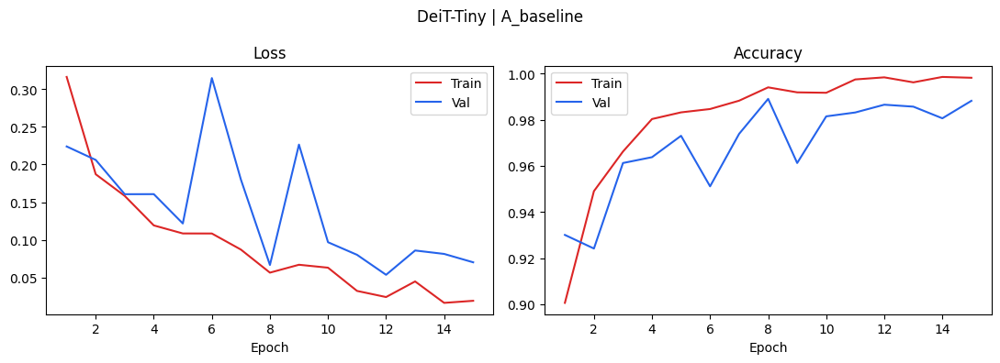

  ✓ Training curves → /kaggle/working/results/curves_DeiT_Tiny_A_baseline.png


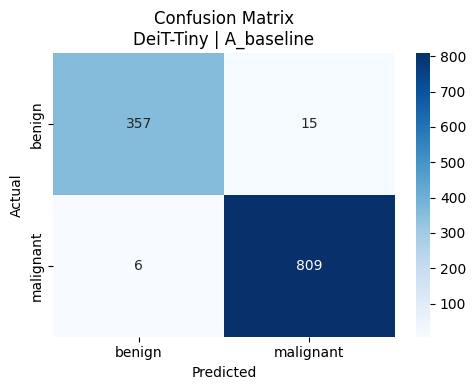

  ✓ Confusion matrix → /kaggle/working/results/cm_DeiT_Tiny_A_baseline.png


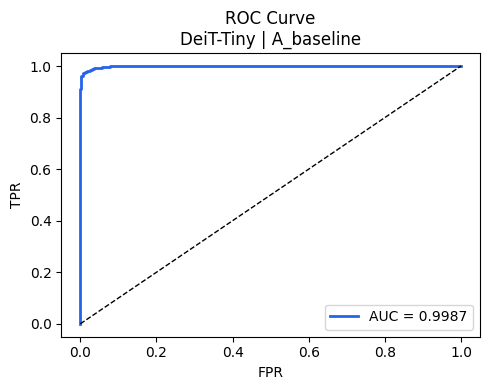

  ✓ ROC curve → /kaggle/working/results/roc_DeiT_Tiny_A_baseline.png


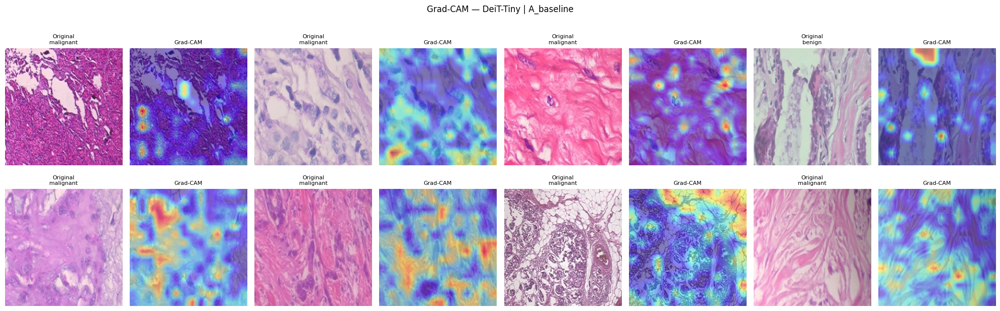

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_DeiT_Tiny_A_baseline.png
  ✓ Result saved → /kaggle/working/results/DeiT_Tiny_A_baseline_result.json

  Model    : DeiT-Tiny
  Pipeline : B_clahe_gamma
  Device   : cuda
[B_clahe_gamma] train=5,535  val=1,187  test=1,187
Epoch   1/30  tr_loss=0.4940 tr_acc=0.7931  vl_loss=0.3127 vl_acc=0.8745
  ✓ Checkpoint saved (val_acc=0.8745)
Epoch   2/30  tr_loss=0.2964 tr_acc=0.9039  vl_loss=0.3293 vl_acc=0.8382
Epoch   3/30  tr_loss=0.2354 tr_acc=0.9388  vl_loss=0.2601 vl_acc=0.9267
  ✓ Checkpoint saved (val_acc=0.9267)
Epoch   4/30  tr_loss=0.1962 tr_acc=0.9510  vl_loss=0.2297 vl_acc=0.9318
  ✓ Checkpoint saved (val_acc=0.9318)
Epoch   5/30  tr_loss=0.1847 tr_acc=0.9615  vl_loss=0.1724 vl_acc=0.9478
  ✓ Checkpoint saved (val_acc=0.9478)
Epoch   6/30  tr_loss=0.1488 tr_acc=0.9722  vl_loss=0.2013 vl_acc=0.9495
  ✓ Checkpoint saved (val_acc=0.9495)
Epoch   7/30  tr_loss=0.1326 tr_acc=0.9772  vl_loss=0.3598 vl_acc=0.9486
Epoch   8/30  tr_loss=0.10

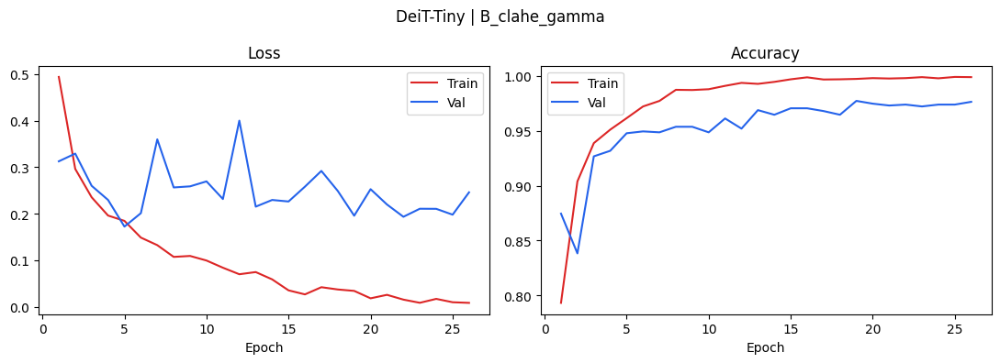

  ✓ Training curves → /kaggle/working/results/curves_DeiT_Tiny_B_clahe_gamma.png


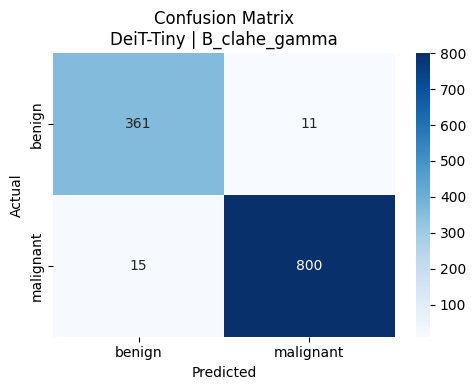

  ✓ Confusion matrix → /kaggle/working/results/cm_DeiT_Tiny_B_clahe_gamma.png


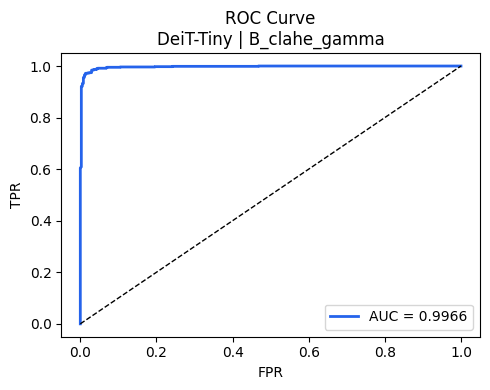

  ✓ ROC curve → /kaggle/working/results/roc_DeiT_Tiny_B_clahe_gamma.png


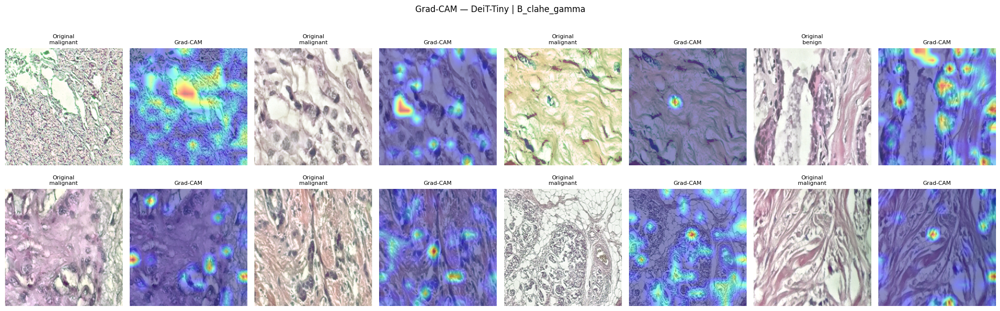

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_DeiT_Tiny_B_clahe_gamma.png
  ✓ Result saved → /kaggle/working/results/DeiT_Tiny_B_clahe_gamma_result.json

  Model    : DeiT-Tiny
  Pipeline : C_clahe_gamma_bilateral
  Device   : cuda
[C_clahe_gamma_bilateral] train=5,535  val=1,187  test=1,187
Epoch   1/30  tr_loss=0.5199 tr_acc=0.7724  vl_loss=0.3411 vl_acc=0.8576
  ✓ Checkpoint saved (val_acc=0.8576)
Epoch   2/30  tr_loss=0.3325 tr_acc=0.8867  vl_loss=0.3654 vl_acc=0.7978
Epoch   3/30  tr_loss=0.2581 tr_acc=0.9243  vl_loss=0.2262 vl_acc=0.9217
  ✓ Checkpoint saved (val_acc=0.9217)
Epoch   4/30  tr_loss=0.2080 tr_acc=0.9435  vl_loss=0.2786 vl_acc=0.8854
Epoch   5/30  tr_loss=0.1870 tr_acc=0.9570  vl_loss=0.2472 vl_acc=0.9250
  ✓ Checkpoint saved (val_acc=0.9250)
Epoch   6/30  tr_loss=0.1561 tr_acc=0.9709  vl_loss=0.2270 vl_acc=0.9301
  ✓ Checkpoint saved (val_acc=0.9301)
Epoch   7/30  tr_loss=0.1568 tr_acc=0.9756  vl_loss=0.2200 vl_acc=0.9478
  ✓ Checkpoint saved (val_acc=0.9478)


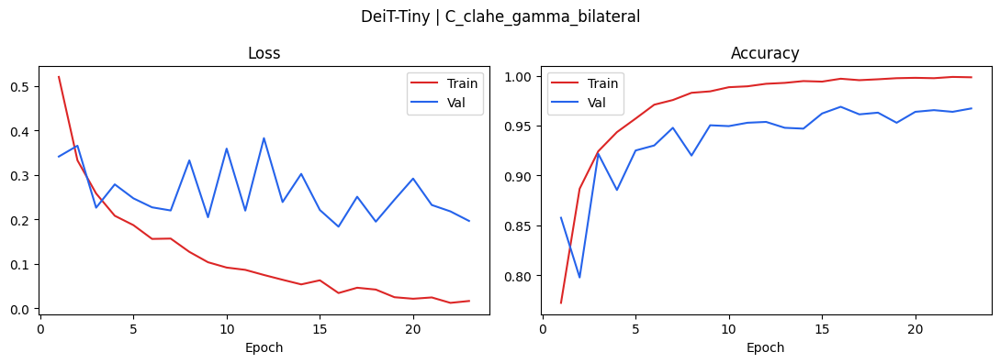

  ✓ Training curves → /kaggle/working/results/curves_DeiT_Tiny_C_clahe_gamma_bilateral.png


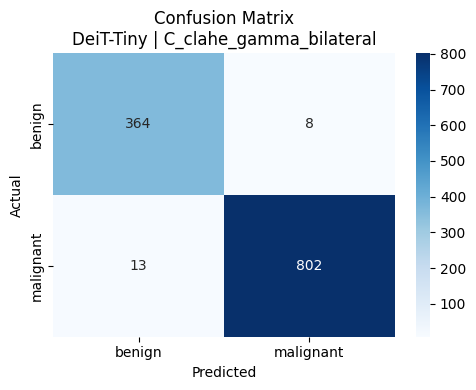

  ✓ Confusion matrix → /kaggle/working/results/cm_DeiT_Tiny_C_clahe_gamma_bilateral.png


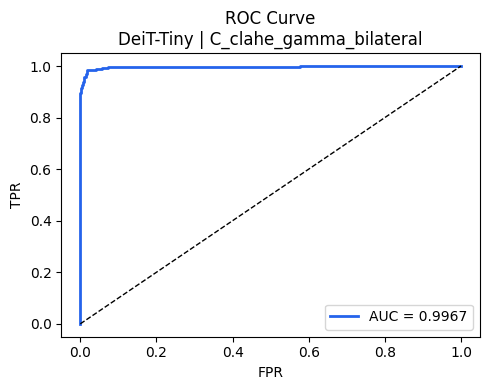

  ✓ ROC curve → /kaggle/working/results/roc_DeiT_Tiny_C_clahe_gamma_bilateral.png


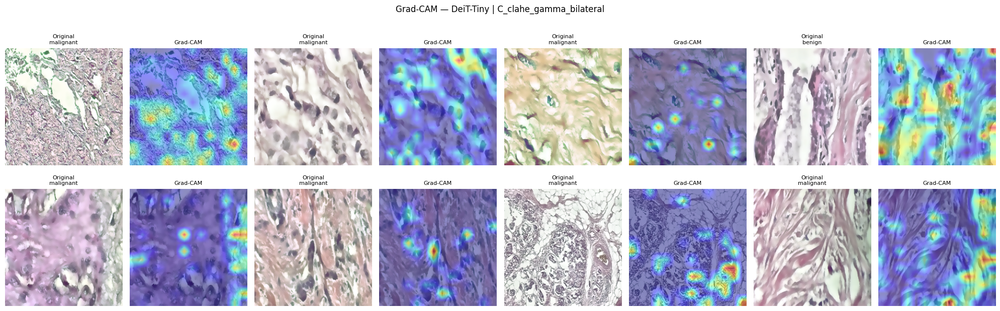

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_DeiT_Tiny_C_clahe_gamma_bilateral.png
  ✓ Result saved → /kaggle/working/results/DeiT_Tiny_C_clahe_gamma_bilateral_result.json

  Model    : Swin-Tiny
  Pipeline : A_baseline
  Device   : cuda
[A_baseline] train=5,535  val=1,187  test=1,187


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/113M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/233 [00:00<?, ?it/s]

SwinForImageClassification LOAD REPORT from: microsoft/swin-tiny-patch4-window7-224
Key               | Status   |                                                                                        
------------------+----------+----------------------------------------------------------------------------------------
classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000]) vs model:torch.Size([2])          
classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000, 768]) vs model:torch.Size([2, 768])

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


Epoch   1/30  tr_loss=0.2850 tr_acc=0.9028  vl_loss=0.1656 vl_acc=0.9452
  ✓ Checkpoint saved (val_acc=0.9452)
Epoch   2/30  tr_loss=0.1622 tr_acc=0.9660  vl_loss=0.1318 vl_acc=0.9722
  ✓ Checkpoint saved (val_acc=0.9722)
Epoch   3/30  tr_loss=0.1240 tr_acc=0.9783  vl_loss=0.0728 vl_acc=0.9806
  ✓ Checkpoint saved (val_acc=0.9806)
Epoch   4/30  tr_loss=0.0843 tr_acc=0.9881  vl_loss=0.1213 vl_acc=0.9730
Epoch   5/30  tr_loss=0.0933 tr_acc=0.9888  vl_loss=0.3216 vl_acc=0.9528
Epoch   6/30  tr_loss=0.0621 tr_acc=0.9924  vl_loss=0.1702 vl_acc=0.9756
Epoch   7/30  tr_loss=0.0677 tr_acc=0.9919  vl_loss=0.0805 vl_acc=0.9806
Epoch   8/30  tr_loss=0.0413 tr_acc=0.9940  vl_loss=0.0493 vl_acc=0.9874
  ✓ Checkpoint saved (val_acc=0.9874)
Epoch   9/30  tr_loss=0.0481 tr_acc=0.9946  vl_loss=0.0557 vl_acc=0.9882
  ✓ Checkpoint saved (val_acc=0.9882)
Epoch  10/30  tr_loss=0.0394 tr_acc=0.9960  vl_loss=0.0365 vl_acc=0.9899
  ✓ Checkpoint saved (val_acc=0.9899)
Epoch  11/30  tr_loss=0.0288 tr_acc=0.9975

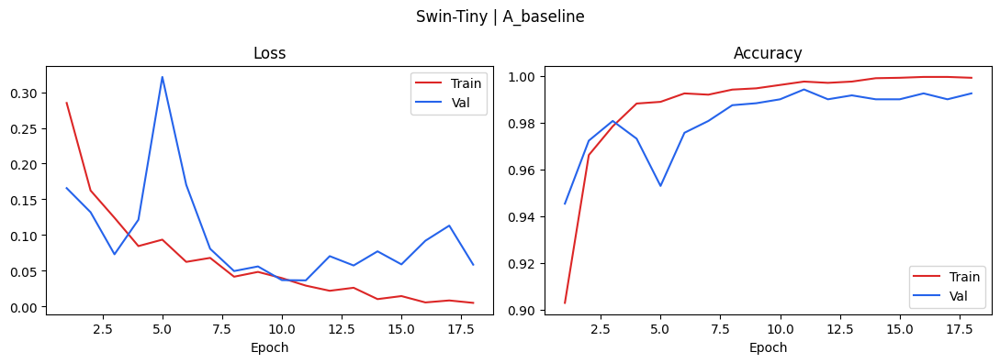

  ✓ Training curves → /kaggle/working/results/curves_Swin_Tiny_A_baseline.png


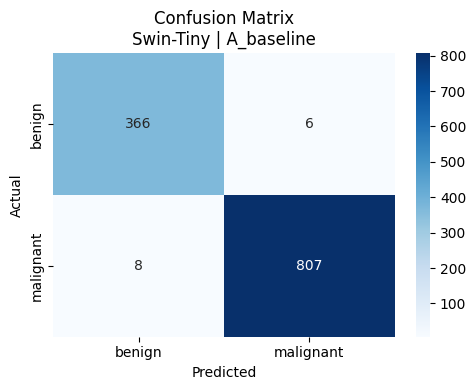

  ✓ Confusion matrix → /kaggle/working/results/cm_Swin_Tiny_A_baseline.png


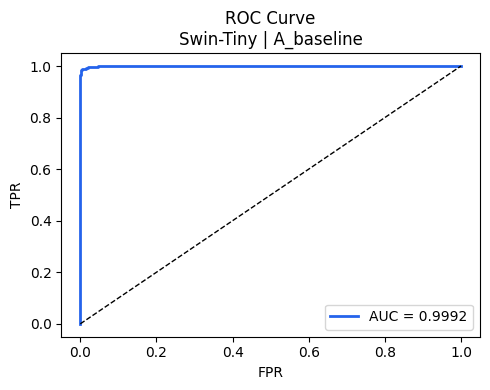

  ✓ ROC curve → /kaggle/working/results/roc_Swin_Tiny_A_baseline.png


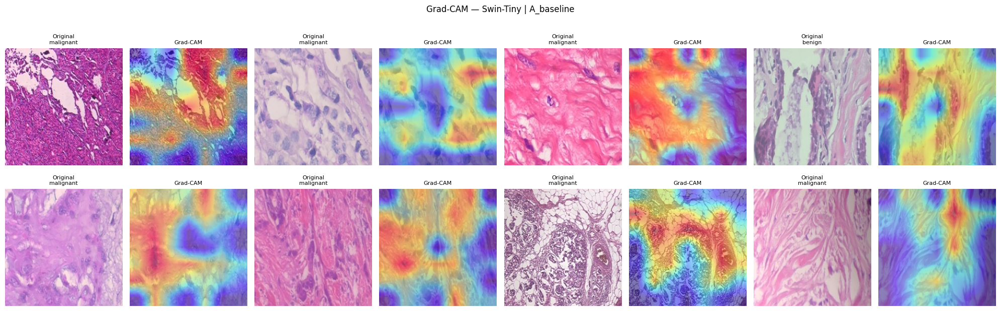

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_Swin_Tiny_A_baseline.png
  ✓ Result saved → /kaggle/working/results/Swin_Tiny_A_baseline_result.json

  Model    : Swin-Tiny
  Pipeline : B_clahe_gamma
  Device   : cuda
[B_clahe_gamma] train=5,535  val=1,187  test=1,187


Loading weights:   0%|          | 0/233 [00:00<?, ?it/s]

SwinForImageClassification LOAD REPORT from: microsoft/swin-tiny-patch4-window7-224
Key               | Status   |                                                                                        
------------------+----------+----------------------------------------------------------------------------------------
classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000]) vs model:torch.Size([2])          
classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000, 768]) vs model:torch.Size([2, 768])

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


Epoch   1/30  tr_loss=0.4113 tr_acc=0.8343  vl_loss=0.2029 vl_acc=0.9183
  ✓ Checkpoint saved (val_acc=0.9183)
Epoch   2/30  tr_loss=0.2209 tr_acc=0.9342  vl_loss=0.3893 vl_acc=0.9233
  ✓ Checkpoint saved (val_acc=0.9233)
Epoch   3/30  tr_loss=0.1589 tr_acc=0.9593  vl_loss=0.1210 vl_acc=0.9587
  ✓ Checkpoint saved (val_acc=0.9587)
Epoch   4/30  tr_loss=0.1485 tr_acc=0.9731  vl_loss=0.1548 vl_acc=0.9612
  ✓ Checkpoint saved (val_acc=0.9612)
Epoch   5/30  tr_loss=0.1543 tr_acc=0.9785  vl_loss=0.3622 vl_acc=0.9469
Epoch   6/30  tr_loss=0.1115 tr_acc=0.9841  vl_loss=0.1399 vl_acc=0.9764
  ✓ Checkpoint saved (val_acc=0.9764)
Epoch   7/30  tr_loss=0.1092 tr_acc=0.9852  vl_loss=0.0974 vl_acc=0.9789
  ✓ Checkpoint saved (val_acc=0.9789)
Epoch   8/30  tr_loss=0.0745 tr_acc=0.9897  vl_loss=0.1020 vl_acc=0.9781
Epoch   9/30  tr_loss=0.0600 tr_acc=0.9926  vl_loss=0.1692 vl_acc=0.9722
Epoch  10/30  tr_loss=0.0612 tr_acc=0.9931  vl_loss=0.2031 vl_acc=0.9773
Epoch  11/30  tr_loss=0.0483 tr_acc=0.9942

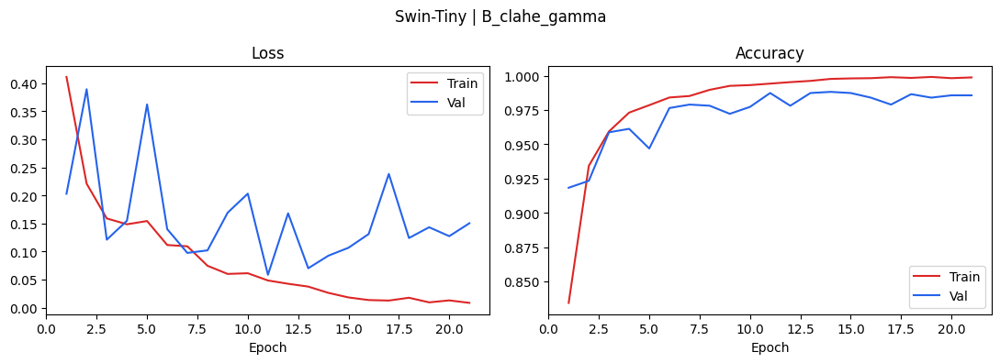

  ✓ Training curves → /kaggle/working/results/curves_Swin_Tiny_B_clahe_gamma.png


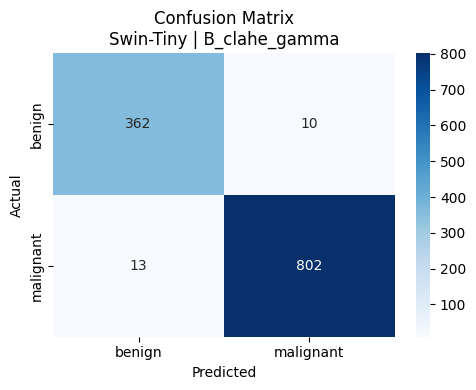

  ✓ Confusion matrix → /kaggle/working/results/cm_Swin_Tiny_B_clahe_gamma.png


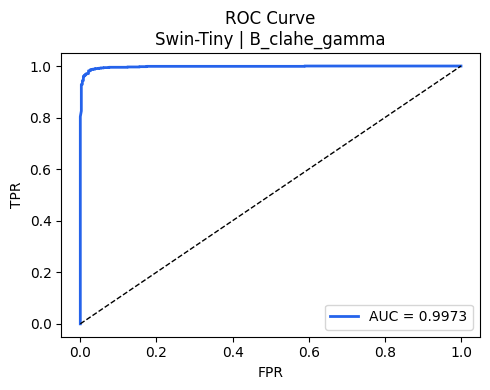

  ✓ ROC curve → /kaggle/working/results/roc_Swin_Tiny_B_clahe_gamma.png


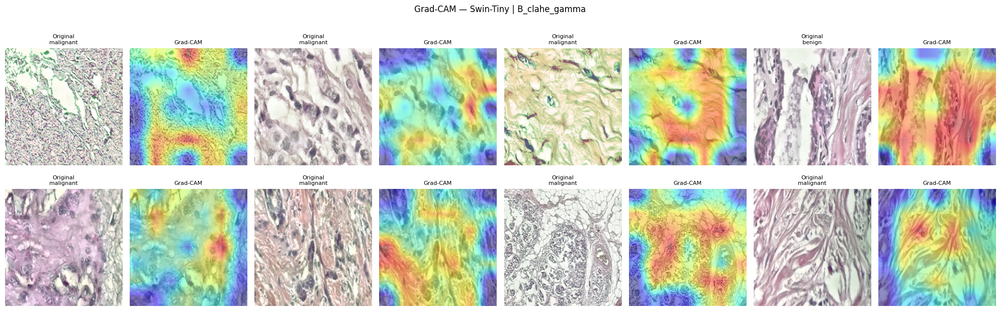

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_Swin_Tiny_B_clahe_gamma.png
  ✓ Result saved → /kaggle/working/results/Swin_Tiny_B_clahe_gamma_result.json

  Model    : Swin-Tiny
  Pipeline : C_clahe_gamma_bilateral
  Device   : cuda
[C_clahe_gamma_bilateral] train=5,535  val=1,187  test=1,187


Loading weights:   0%|          | 0/233 [00:00<?, ?it/s]

SwinForImageClassification LOAD REPORT from: microsoft/swin-tiny-patch4-window7-224
Key               | Status   |                                                                                        
------------------+----------+----------------------------------------------------------------------------------------
classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000]) vs model:torch.Size([2])          
classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1000, 768]) vs model:torch.Size([2, 768])

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


Epoch   1/30  tr_loss=0.4539 tr_acc=0.8038  vl_loss=0.3628 vl_acc=0.8871
  ✓ Checkpoint saved (val_acc=0.8871)
Epoch   2/30  tr_loss=0.2494 tr_acc=0.9238  vl_loss=0.3104 vl_acc=0.9242
  ✓ Checkpoint saved (val_acc=0.9242)
Epoch   3/30  tr_loss=0.2101 tr_acc=0.9442  vl_loss=0.1488 vl_acc=0.9511
  ✓ Checkpoint saved (val_acc=0.9511)
Epoch   4/30  tr_loss=0.1698 tr_acc=0.9586  vl_loss=0.3284 vl_acc=0.9444
Epoch   5/30  tr_loss=0.1451 tr_acc=0.9716  vl_loss=0.3502 vl_acc=0.9436
Epoch   6/30  tr_loss=0.1297 tr_acc=0.9781  vl_loss=0.3433 vl_acc=0.9503
Epoch   7/30  tr_loss=0.1240 tr_acc=0.9819  vl_loss=0.0969 vl_acc=0.9730
  ✓ Checkpoint saved (val_acc=0.9730)
Epoch   8/30  tr_loss=0.0745 tr_acc=0.9902  vl_loss=0.1263 vl_acc=0.9688
Epoch   9/30  tr_loss=0.0678 tr_acc=0.9910  vl_loss=0.1595 vl_acc=0.9781
  ✓ Checkpoint saved (val_acc=0.9781)
Epoch  10/30  tr_loss=0.0574 tr_acc=0.9924  vl_loss=0.0979 vl_acc=0.9798
  ✓ Checkpoint saved (val_acc=0.9798)
Epoch  11/30  tr_loss=0.0386 tr_acc=0.9951

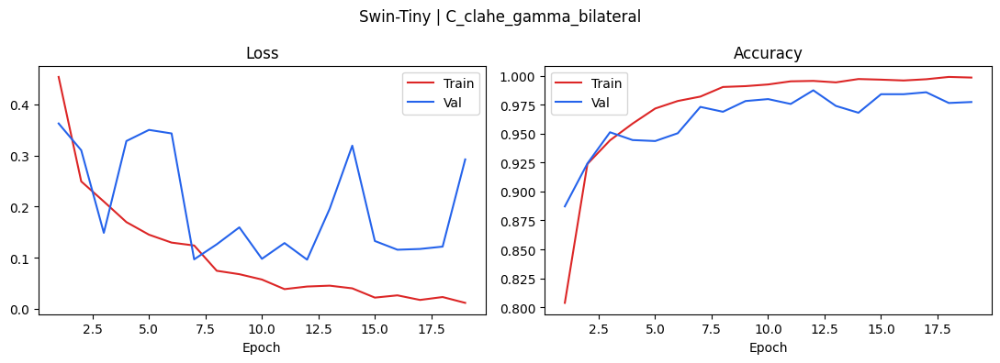

  ✓ Training curves → /kaggle/working/results/curves_Swin_Tiny_C_clahe_gamma_bilateral.png


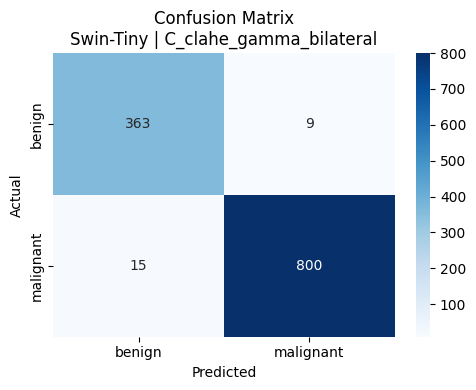

  ✓ Confusion matrix → /kaggle/working/results/cm_Swin_Tiny_C_clahe_gamma_bilateral.png


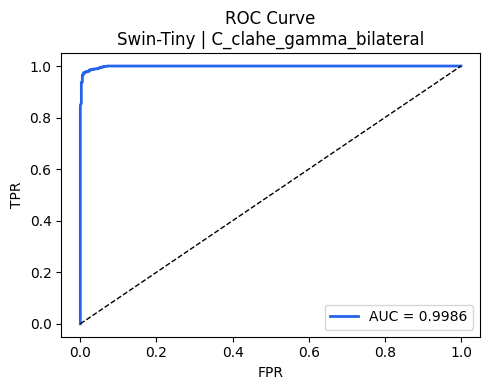

  ✓ ROC curve → /kaggle/working/results/roc_Swin_Tiny_C_clahe_gamma_bilateral.png


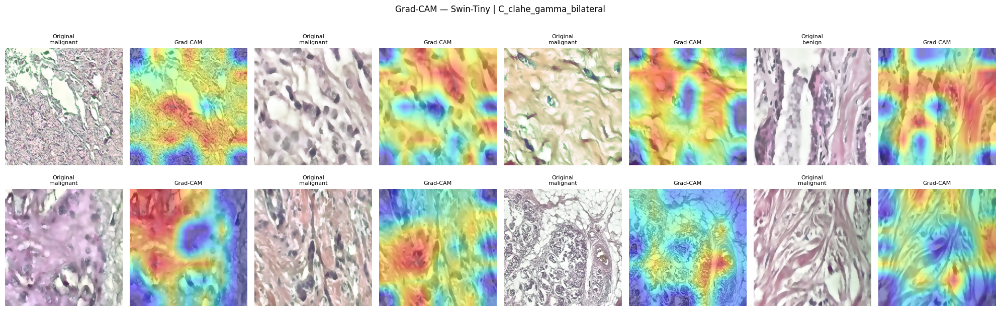

  ✓ Grad-CAM grid → /kaggle/working/results/gradcam_Swin_Tiny_C_clahe_gamma_bilateral.png
  ✓ Result saved → /kaggle/working/results/Swin_Tiny_C_clahe_gamma_bilateral_result.json


In [35]:
# ─────────────────────────────────────────────
# 11. RUN ALL EXPERIMENTS
# ─────────────────────────────────────────────
#
# İstediğin kombinasyonu açıp/kapatabilirsin.
# Tüm 6 kombinasyon ~4-6 saat sürebilir (T4 GPU).
# Hızlı test için sadece 1-2 kombinasyon aç.
#
# ─────────────────────────────────────────────

EXPERIMENTS = [
    # (model_name,  pipeline_name)
    ("DeiT-Tiny",  "A_baseline"),
    ("DeiT-Tiny",  "B_clahe_gamma"),
    ("DeiT-Tiny",  "C_clahe_gamma_bilateral"),
    ("Swin-Tiny",  "A_baseline"),
    ("Swin-Tiny",  "B_clahe_gamma"),
    ("Swin-Tiny",  "C_clahe_gamma_bilateral"),
]

RUN_GRADCAM = True   # Grad-CAM görselleştirmesi ister misin?

all_results = []

for model_name, pipeline_name in EXPERIMENTS:
    result = train_one_experiment(
        model_name    = model_name,
        pipeline_name = pipeline_name,
        run_gradcam   = RUN_GRADCAM,
    )
    all_results.append(result)



  TÜM DENEYLER TAMAMLANDI — Rapor oluşturuluyor...

  EXPERIMENT SUMMARY
    Model                      Pipeline  accuracy  precision  recall  f1_score    auc   dice    iou
DeiT-Tiny                  A — Baseline    0.9823     0.9818  0.9926    0.9872 0.9987 0.9793 0.9596
DeiT-Tiny             B — CLAHE + Gamma    0.9781     0.9864  0.9816    0.9840 0.9966 0.9746 0.9507
DeiT-Tiny C — CLAHE + Gamma + Bilateral    0.9823     0.9901  0.9840    0.9871 0.9967 0.9795 0.9600
Swin-Tiny                  A — Baseline    0.9882     0.9926  0.9902    0.9914 0.9992 0.9863 0.9731
Swin-Tiny             B — CLAHE + Gamma    0.9806     0.9877  0.9840    0.9859 0.9973 0.9775 0.9562
Swin-Tiny C — CLAHE + Gamma + Bilateral    0.9798     0.9889  0.9816    0.9852 0.9986 0.9766 0.9544

  ✓ Summary CSV → /kaggle/working/results/summary_table.csv


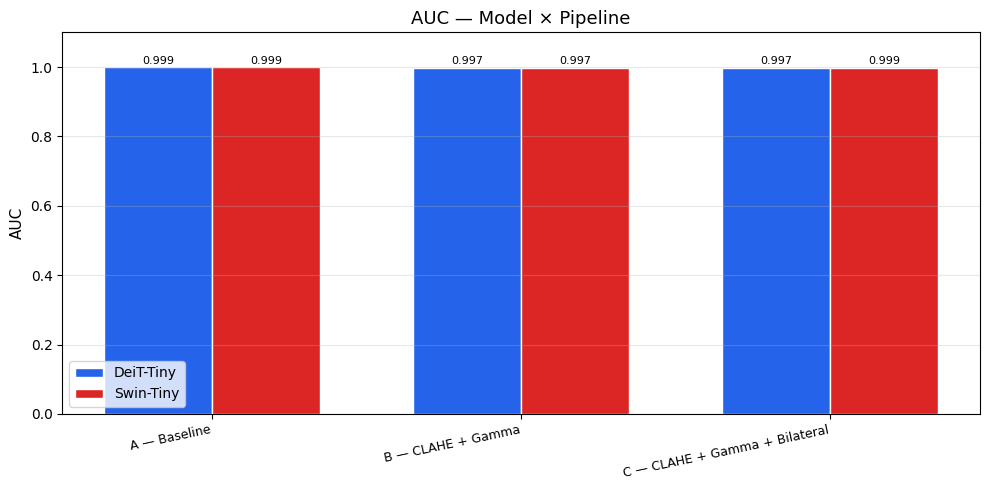

  ✓ Bar chart (auc) → /kaggle/working/results/comparison_auc.png


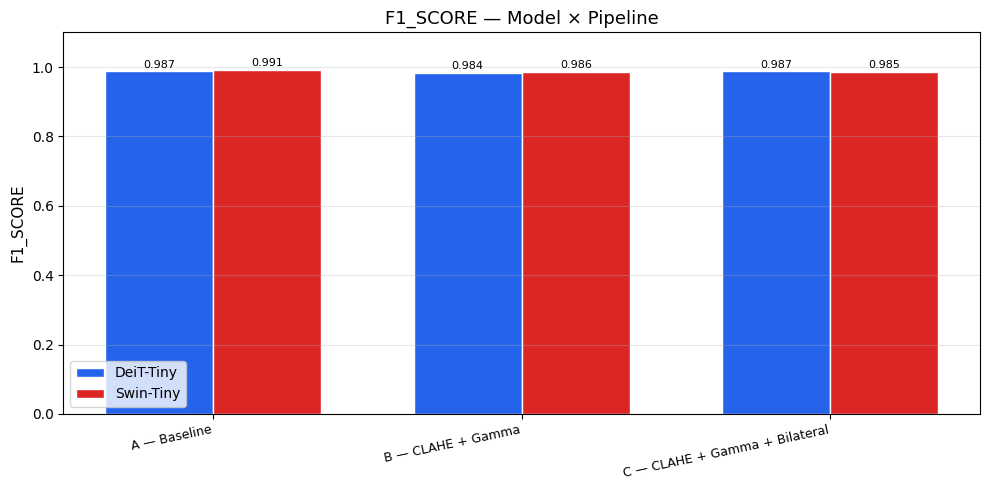

  ✓ Bar chart (f1_score) → /kaggle/working/results/comparison_f1_score.png


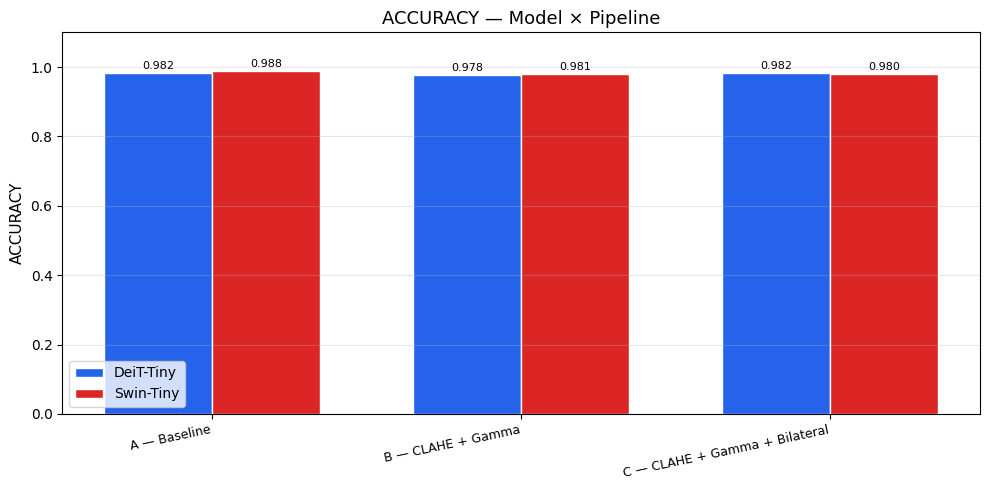

  ✓ Bar chart (accuracy) → /kaggle/working/results/comparison_accuracy.png


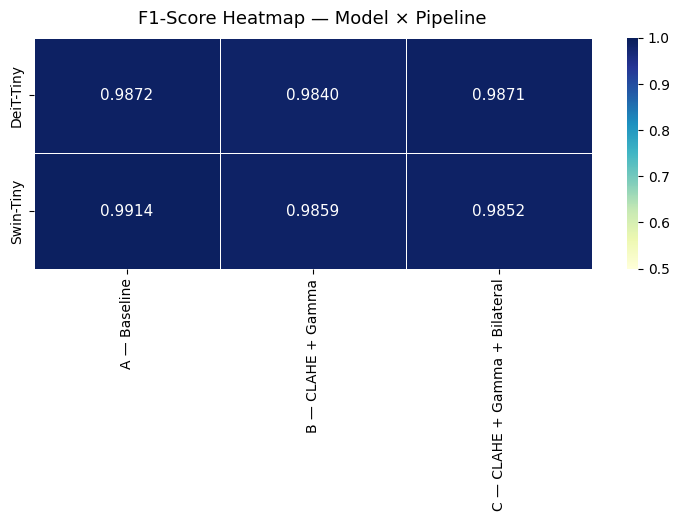

  ✓ F1 heatmap → /kaggle/working/results/f1_heatmap.png


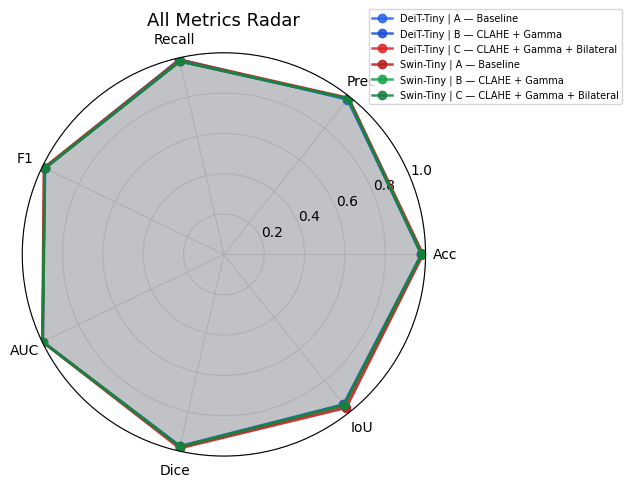

  ✓ Radar chart → /kaggle/working/results/radar_chart.png

✓ Tüm görseller ve CSV /kaggle/working/results/ klasöründe.


In [36]:

# ─────────────────────────────────────────────
# 12. FINAL REPORT
# ─────────────────────────────────────────────

print("\n\n" + "="*60)
print("  TÜM DENEYLER TAMAMLANDI — Rapor oluşturuluyor...")
print("="*60)

summary_df = generate_report(all_results)

print("\n✓ Tüm görseller ve CSV /kaggle/working/results/ klasöründe.")